In [1]:
import matplotlib
import matplotlib.pyplot as plt 
import numpy as np
import pandas as pd
import os
import umap
import datashader as ds
import colorcet as cc
import igraph
import tqdm
from scipy import sparse
import pandas as pd
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.cluster import KMeans

from matplotlib.collections import PolyCollection
from matplotlib.colors import ListedColormap

from dredFISH.Analysis import TissueGraph
from dredFISH.Visualization import Viz
from dredFISH.Utils.__init__plots import * 
from dredFISH.Utils import powerplots
from dredFISH.Utils import miscu
from dredFISH.Utils import tmgu

import importlib
importlib.reload(Viz)
importlib.reload(TissueGraph)

<module 'dredFISH.Analysis.TissueGraph' from '/bigstore/GeneralStorage/fangming/projects/dredfish/packages/dredFISH/dredFISH/Analysis/TissueGraph.py'>

In [2]:
# %%time
# # slow for 24 bits; fast for 2D
# k = 30 
# NN = NearestNeighbors(n_neighbors=k)
# NN.fit(XY)
# knn = NN.kneighbors(XY, return_distance=False)

# knn
# # use pynndescent


In [3]:
# %%time
# n_topics_list = [2,5,10]
# n_procs = 3 

# topic_cls = Classification.TopicClassifier(TMG.Layers[0])
# topic_cls.train(n_topics_list=n_topics_list, n_procs=n_procs)
# topics = topic_cls.classify(topic_cls.Env)

# Key lines
# n_topics = 10
# lda = LatentDirichletAllocation(n_components=n_topics)
# B = lda.fit(env)
# T = lda.transform(Env)

#### Load data

In [4]:
respath = '/bigstore/GeneralStorage/fangming/projects/dredfish/figures/'

In [5]:
basepth = '/bigstore/GeneralStorage/Data/dredFISH/Dataset1'
!ls -alhtr $basepth
!head $basepth"/TMG.json"

total 108M
-rw-r--r-- 1 zach     wollmanlab  16M Jun  9 14:55 DPNMF_PolyA_2021Nov19_Section_-1850X_270Y_matrix.csv
-rw-r--r-- 1 zach     wollmanlab  20M Jun  9 14:55 DPNMF_PolyA_2021Nov19_Section_-1850X_270Y_metadata.csv
-rw-rw-r-- 1 rwollman wollmanlab  165 Jul  7 16:00 TMG.json
-rw-r--r-- 1 fangming wollmanlab  40M Jul  7 16:00 cell.h5ad
-rw-r--r-- 1 fangming wollmanlab 6.8M Jul  7 16:00 isozone.h5ad
-rw-rw-r-- 1 rwollman wollmanlab 647K Jul  7 16:00 region.h5ad
-rw-r--r-- 1 fangming wollmanlab    3 Jul  7 16:00 Taxonomy_clusters.csv
-rw-r--r-- 1 fangming wollmanlab    3 Jul  7 16:00 Taxonomy_topics.csv
drwxrwxrwx 7 zach     wollmanlab 4.0K Jul  8 12:44 ..
drwxrwxr-x 2 rwollman wollmanlab 4.0K Jul 14 14:17 .
-rw-r--r-- 1 fangming wollmanlab  27M Jul 14 14:19 analysis_dev.csv
{"layers_graph": [[0, 1], [0, 2]], "layer_taxonomy_mapping": {"0": 0, "1": 0, "2": 1}, "Taxonomies": ["clusters", "topics"], "Layers": ["cell", "isozone", "region"]}

In [6]:
df = pd.read_csv(
    os.path.join(basepth, "analysis_dev.csv"))
df

,Unnamed: 0,x,y,umap_x,umap_y,b0,b1,b2,b3,b4,...,type_r0.01,type_r0.02,type_r0.05,type_r0.1,type_r0.2,type_r0.5,type_r1,type_r2,type_r5,type_r10
0,0,1911.666962,-1749.638192,-1.901928,-2.967294,-0.603849,1.714861,0.594060,0.139496,1.509942,...,t1,t1,t1,t3,t2,t5,t8,t14,t42,t35
1,1,1850.678429,-1747.172043,-1.789862,-2.849200,-0.530279,1.681959,1.301185,-0.464006,1.570054,...,t1,t1,t1,t3,t2,t5,t8,t14,t42,t35
2,2,1515.123295,-1746.940031,0.184749,0.178933,-0.603849,-0.362498,0.620053,-1.128423,1.206578,...,t1,t1,t1,t3,t2,t5,t10,t4,t34,t61
3,3,1426.161788,-1748.456394,-0.917661,0.854812,-0.298989,1.023065,1.517082,-0.341796,0.475449,...,t1,t1,t1,t3,t2,t4,t10,t4,t53,t63
4,4,1739.792930,-1749.407386,2.384448,-0.265512,-0.603849,-1.351786,1.025515,-1.128423,0.327118,...,t1,t1,t1,t1,t1,t1,t6,t3,t19,t13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77841,77841,-2188.756848,-1084.480934,-4.423579,4.242474,-0.603849,-0.271399,-0.666686,0.269214,0.821624,...,t1,t1,t1,t3,t2,t8,t12,t24,t60,t60
77842,77842,-2257.822983,-1083.270665,-5.205501,5.288445,0.936062,0.386319,-0.614982,1.752306,0.067531,...,t1,t1,t3,t4,t6,t8,t12,t7,t3,t1
77843,77843,-2475.320577,-1083.995803,-5.016026,4.596395,-0.603849,-0.228163,-0.612215,0.895132,0.247026,...,t1,t1,t2,t2,t5,t7,t7,t25,t48,t48
77844,77844,-2311.578984,-1086.717336,1.987716,0.121741,-0.603849,-1.153599,0.699586,-0.204732,1.546018,...,t1,t1,t1,t1,t1,t1,t6,t6,t50,t108


In [7]:
TMG = TissueGraph.TissueMultiGraph(basepath=basepth, 
                                   redo=False, # load existing 
                                  )
TMG

/bigstore/GeneralStorage/Data/dredFISH/Dataset1/cell.h5ad
/bigstore/GeneralStorage/Data/dredFISH/Dataset1/isozone.h5ad
/bigstore/GeneralStorage/Data/dredFISH/Dataset1/region.h5ad


In [8]:
# spatial coordinates
layer = TMG.Layers[0]
XY = layer.XY
x, y = XY[:,0], XY[:,1]
###
x, y = y, x # a temporary hack
###

cells = layer.adata.obs.index.values

N = layer.N
print(N)
# measured basis
ftrs_mat = layer.feature_mat

# umap_mat = umap.UMAP(n_neighbors=30, min_dist=0.1).fit_transform(ftrs_mat)

# types

# regions

77846


In [9]:
labels = df['type_r0.1'].values
edges = np.asarray(layer.SG.get_edgelist()) 
ctg, ctg_idx = np.unique(labels, return_inverse=True) 
print(ctg)

i = edges[:,0] # cells
j = ctg_idx[edges[:,1]] # types it connects
dat = np.repeat(1, len(i))

env_mat = sparse.coo_matrix((dat, (i,j)), shape=(N, len(ctg))).toarray() # dense
env_mat = env_mat/env_mat.sum(axis=1).reshape(-1,1)
env_mat = np.nan_to_num(env_mat, 0)
env_mat

['t1' 't2' 't3' 't4' 't5' 't6']


/tmp/ipykernel_1296507/2235391810.py:11: RuntimeWarning: invalid value encountered in true_divide
  env_mat = env_mat/env_mat.sum(axis=1).reshape(-1,1)


array([[0.8       , 0.        , 0.2       , 0.        , 0.        ,
        0.        ],
       [0.71428571, 0.        , 0.28571429, 0.        , 0.        ,
        0.        ],
       [0.66666667, 0.        , 0.33333333, 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        ]])

In [10]:
%%time
k_kms = [2,5,10,20,50,100]
for k_km in tqdm.tqdm(k_kms):
    kmeans = KMeans(n_clusters=k_km)
    reg_clsts = kmeans.fit_predict(env_mat)
    df[f'type_reg_k{k_km}'] = np.char.add('t', np.array(reg_clsts).astype(str))

100%|██████████| 6/6 [00:14<00:00,  2.41s/it]

CPU times: user 11min 13s, sys: 47.6 s, total: 12min 1s
Wall time: 14.5 s


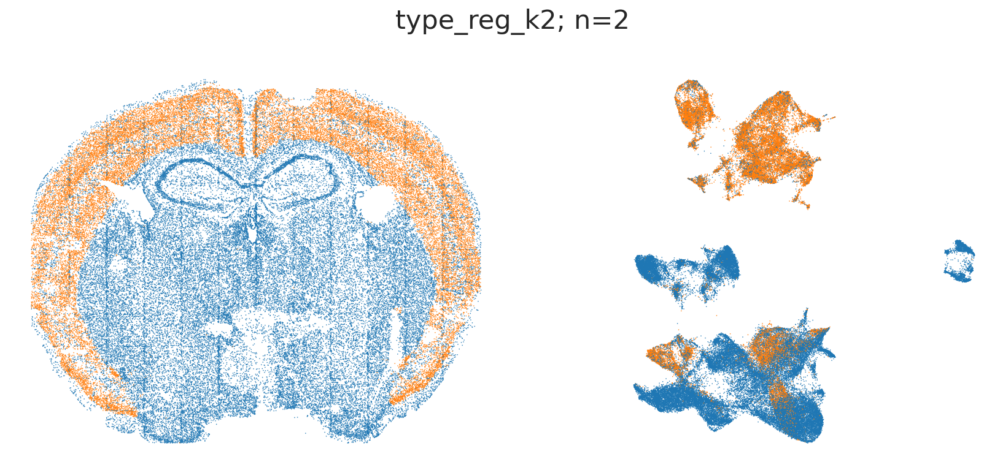

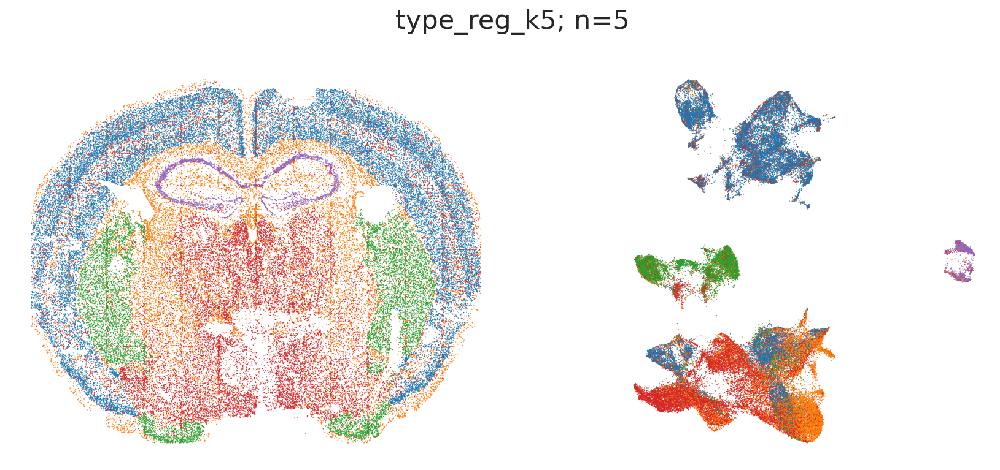

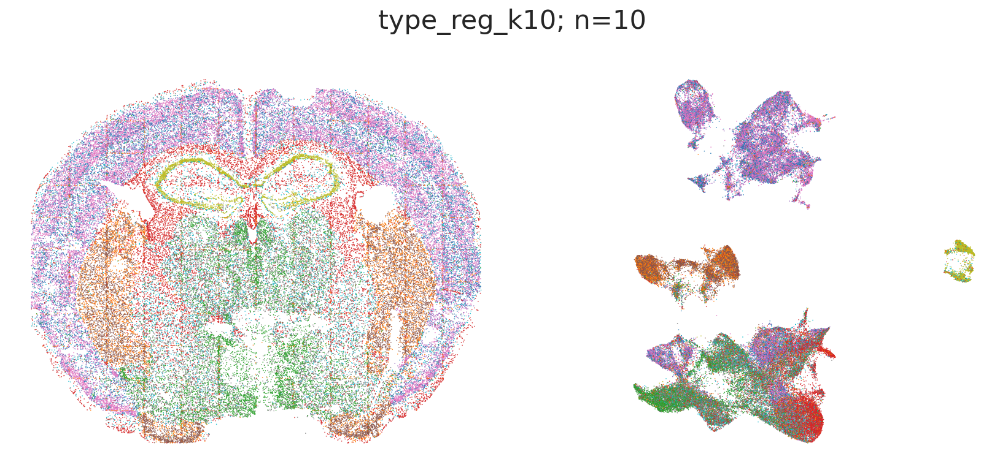

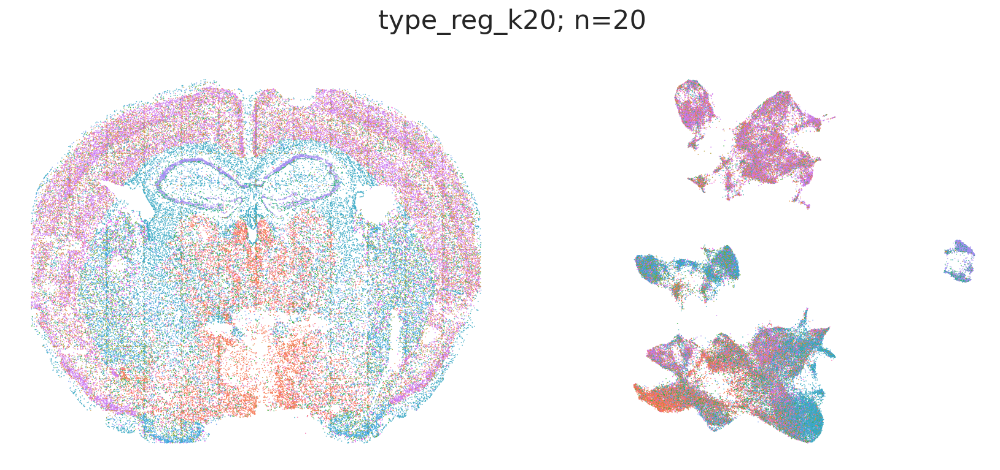

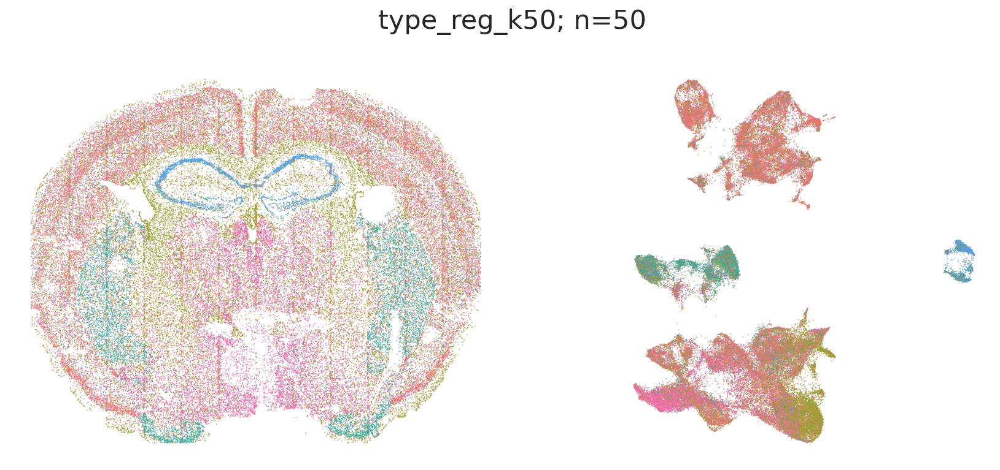

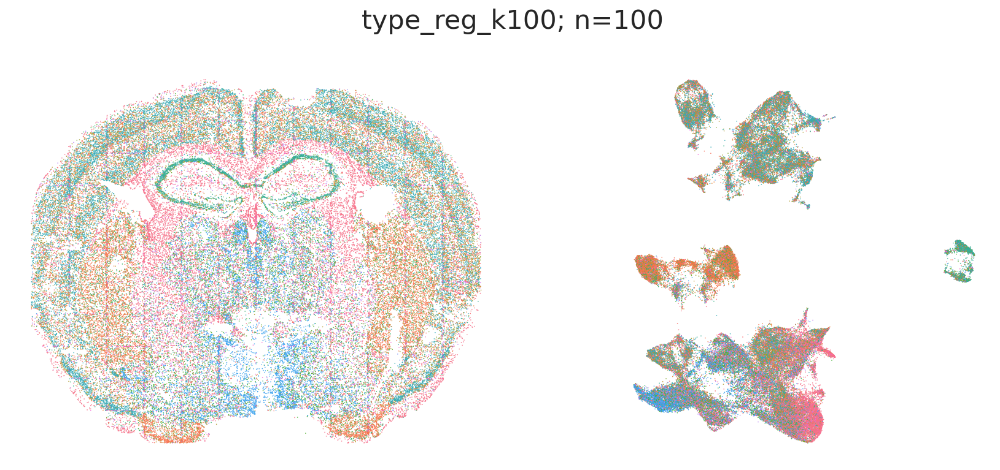

In [11]:
for k_km in k_kms:
    hue = f'type_reg_k{k_km}'
    hue_order = np.sort(np.unique(df[hue]))
    ntypes = len(hue_order)

    fig, axs = plt.subplots(1, 2, figsize=(8*2,6))
    fig.suptitle(f"{hue}; n={ntypes}")
    ax = axs[0]
    sns.scatterplot(data=df, x='x', y='y', 
                    hue=hue, hue_order=hue_order, 
                    s=0.5, edgecolor=None, 
                    legend=False,
                    ax=ax)
    # ax.legend(loc='upper left', bbox_to_anchor=(0, -0.1), ncol=5)
    ax.set_aspect('equal')
    ax.axis('off')

    ax = axs[1]
    sns.scatterplot(data=df, x='umap_x', y='umap_y', 
                    hue=hue, hue_order=hue_order, 
                    s=0.5, edgecolor=None, 
                    legend=False,
                    ax=ax)
    # ax.legend(loc='upper left', bbox_to_anchor=(0, -0.1), ncol=5)
    ax.set_aspect('equal')
    ax.axis('off')
    fig.subplots_adjust(wspace=0)
    plt.show()

# Delaunay k neighbor analysis

In [12]:
dgr = layer.SG.indegree() # same as out

Text(0, 0.5, 'PDF')

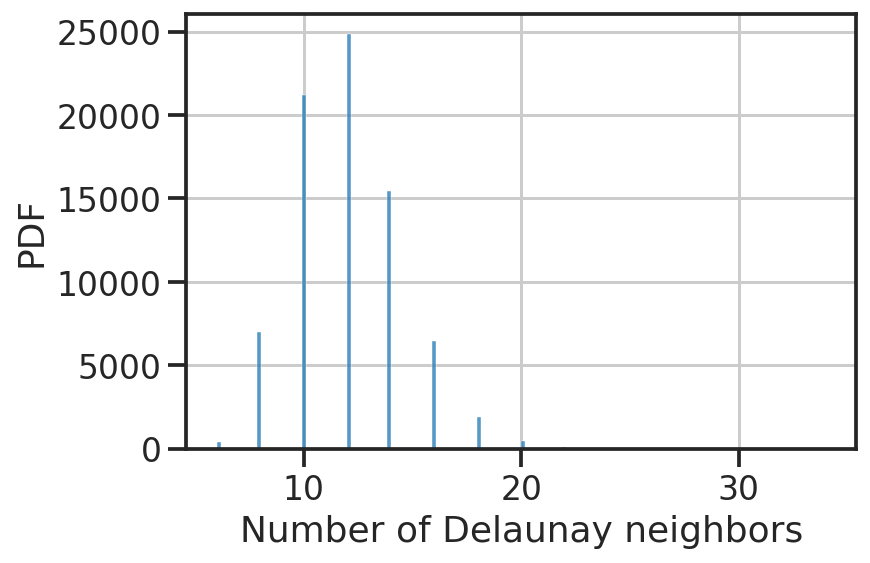

In [13]:
sns.histplot(dgr)
plt.xlabel('Number of Delaunay neighbors')
plt.ylabel('PDF')

Text(0, 0.5, 'CDF')

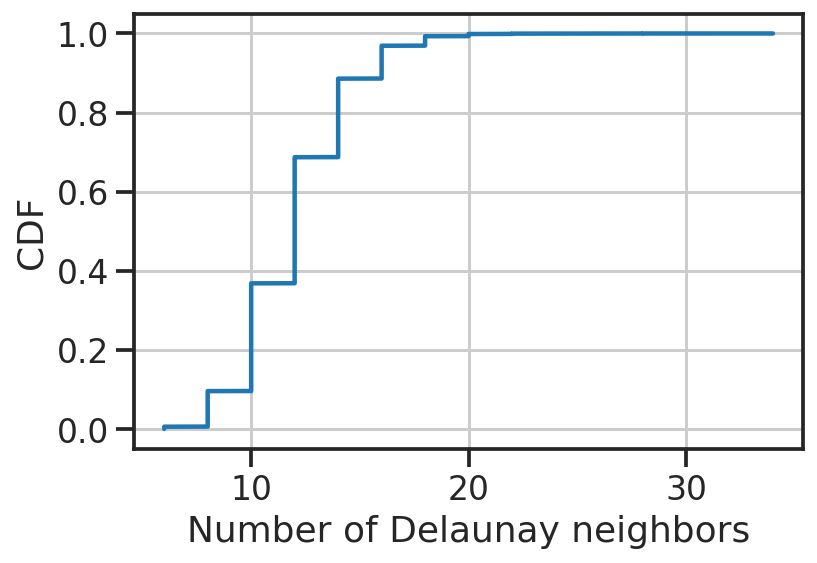

In [14]:
plt.plot(np.sort(dgr), np.linspace(0,1,len(dgr)))
plt.xlabel('Number of Delaunay neighbors')
plt.ylabel('CDF')

# Get from region types to regions; and visualize region boundaries 

In [15]:
k_km = 10
region_types = df[f'type_reg_k{k_km}'].values
region_types

array(['t9', 't9', 't9', ..., 't1', 't1', 't1'], dtype=object)

In [16]:
polys = TMG.Geoms[0]['poly'] #) #) #[0]
bdbox = np.array(TMG.Geoms[0]['BoundingBox'].exterior.xy).T

# a hack
polys = [np.vstack([poly[:,1], poly[:,0]]).T for poly in polys]
bdbox = np.array(np.vstack([bdbox[:,1], bdbox[:,0]])).T
# end of the hack

mx = np.max(bdbox,axis=0)
mn = np.min(bdbox,axis=0)

ctg, idx = np.unique(region_types, return_inverse=True)
colors = sns.color_palette("tab10", len(ctg))
colors

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (0.7372549019607844, 0.7411764705882353, 0.13333333333333333),
 (0.09019607843137255, 0.7450980392156863, 0.8117647058823529)]

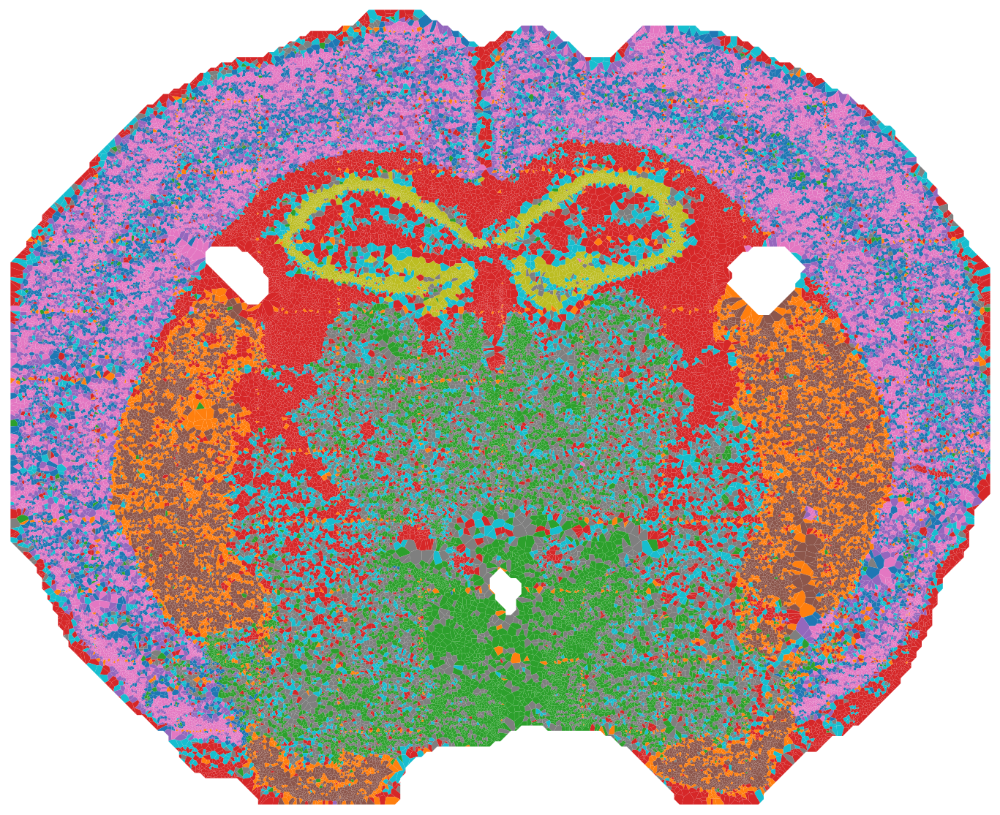

In [17]:
fig, ax = plt.subplots(figsize=(12,10))
p = PolyCollection(polys, edgecolors=('none'), cmap=ListedColormap(colors)) # cmap=self.clrmp)
p.set_array(idx)

ax.add_collection(p)
ax.set_aspect('equal') #, 'box')
ax.set_xlim([mn[0],mx[0]])
ax.set_ylim([mn[1],mx[1]])
ax.axis('off')

plt.show()

# get regions (region type zones) 

In [18]:
# # get SG
# SG = layer.SG

# # trim edges -- remove connects from diffent types
# edges = np.asarray(SG.get_edgelist())
# edges_bytype = region_types[edges]
# edges_sametype = edges[edges_bytype[:,0]==edges_bytype[:,1]]
    
# # get components (same type and spatially connected); each component is assigned an index
# zones = igraph.Graph(n=N, edges=edges_sametype, directed = False)
# zone_ids = np.asarray(zones.components().membership)
# zone_ids

# # how do you visualize it?

# LDA

In [19]:
%%time
lda = LatentDirichletAllocation(n_components=5)
y5 = lda.fit_transform(env_mat)
y5

CPU times: user 2min 32s, sys: 68.1 ms, total: 2min 33s
Wall time: 2min 33s


array([[0.10003908, 0.18666057, 0.10159458, 0.51170572, 0.10000006],
       [0.10004105, 0.233586  , 0.10172964, 0.46464326, 0.10000005],
       [0.10004219, 0.25891471, 0.10177938, 0.43926367, 0.10000004],
       ...,
       [0.2       , 0.2       , 0.2       , 0.2       , 0.2       ],
       [0.2       , 0.2       , 0.2       , 0.2       , 0.2       ],
       [0.2       , 0.2       , 0.2       , 0.2       , 0.2       ]])

In [20]:
%%time
lda = LatentDirichletAllocation(n_components=10)
y10 = lda.fit_transform(env_mat)
y10

CPU times: user 2min 9s, sys: 36.6 ms, total: 2min 9s
Wall time: 2min 9s


array([[0.05000185, 0.05011276, 0.05001365, ..., 0.05000181, 0.05011274,
        0.05020631],
       [0.05000165, 0.05015427, 0.05001879, ..., 0.05000162, 0.05015436,
        0.05029843],
       [0.05000154, 0.05017258, 0.05002162, ..., 0.05000151, 0.05017243,
        0.05035006],
       ...,
       [0.1       , 0.1       , 0.1       , ..., 0.1       , 0.1       ,
        0.1       ],
       [0.1       , 0.1       , 0.1       , ..., 0.1       , 0.1       ,
        0.1       ],
       [0.1       , 0.1       , 0.1       , ..., 0.1       , 0.1       ,
        0.1       ]])

In [21]:
y10d = np.argmax(y10, axis=1)
y5d = np.argmax(y5, axis=1)
np.unique(y10d)

array([0, 2, 3, 4, 5, 6, 7, 9])

In [22]:
region_types = y5d
polys = TMG.Geoms[0]['poly'] #) #) #[0]
bdbox = np.array(TMG.Geoms[0]['BoundingBox'].exterior.xy).T

# a hack
polys = [np.vstack([poly[:,1], poly[:,0]]).T for poly in polys]
bdbox = np.array(np.vstack([bdbox[:,1], bdbox[:,0]])).T
# end of the hack

mx = np.max(bdbox,axis=0)
mn = np.min(bdbox,axis=0)

ctg, idx = np.unique(region_types, return_inverse=True)
colors = sns.color_palette("tab10", len(ctg))
colors

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353)]

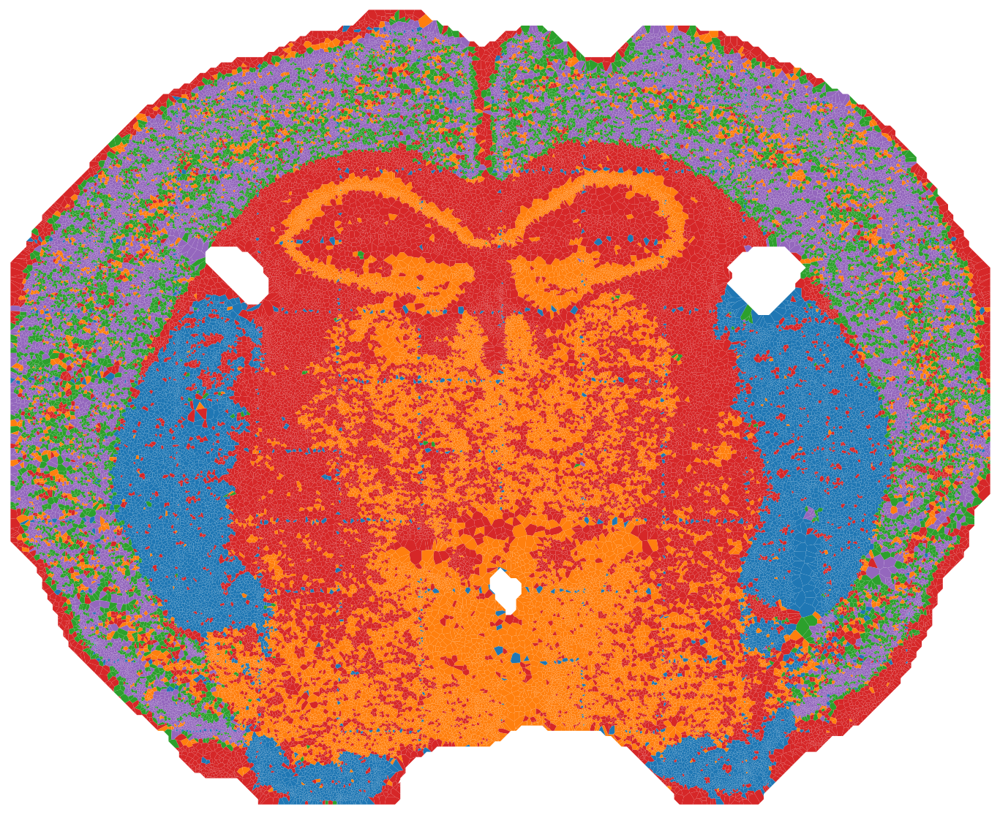

In [23]:
fig, ax = plt.subplots(figsize=(12,10))
p = PolyCollection(polys, edgecolors=('none'), cmap=ListedColormap(colors)) # cmap=self.clrmp)
p.set_array(idx)

ax.add_collection(p)
ax.set_aspect('equal') #, 'box')
ax.set_xlim([mn[0],mx[0]])
ax.set_ylim([mn[1],mx[1]])
ax.axis('off')

plt.show()

# TMG related stuff (can't run; ref only)

In [24]:
def contract_graph(self, TypeVec=None):
    """find zones/region, i.e. spatially continous areas in the graph the same (cell/microenvironment) type

    reduce graph size by merging spatial neighbors of same type. 
    Given a vector of types, will contract the graph to merge vertices that are both next to each other and of the same type. 

    Parameters
    ----------
    TypeVec : 1D numpy array with dtype int (default value is self.Type)
        a vector of Types for each node. If None, will use self.Type

    Note
    ----
    Default behavior is to assign the contracted TG the same taxonomy as the original graph. 

    Returns
    -------
    TissueGraph 
        A TG object after vertices merging. 
    """

    # Figure out which type to use
    if TypeVec is None: 
        TypeVec = self.Type

    # get edge list - work with names and not indexes in case things shift around (they shouldn't),     
    EL = np.asarray(self.SG.get_edgelist()).astype("int")
    nm = self.adata.obs["name"]
    EL[:,0] = np.take(nm,EL[:,0])
    EL[:,1] = np.take(nm,EL[:,1])

    # only keep edges where neighbors are of same types
    EL = EL[np.take(TypeVec,EL[:,0]) == np.take(TypeVec,EL[:,1]),:]

    # remake a graph with potentially many components
    IsoZonesGraph = igraph.Graph(n=self.N, edges=EL, directed = False)
    IsoZonesGraph = IsoZonesGraph.as_undirected().simplify()

    # because we used both type and proximity, the original graph (based only on proximity)
    # that was a single component graph will be broken down to multiple components 
    # finding clusters for each component. 
    cmp = IsoZonesGraph.components()

    IxMapping = np.asarray(cmp.membership)

    ZoneName, ZoneSingleIx = np.unique(IxMapping, return_index=True) # be cautious

    # zone size sums the current graph zone size per each aggregate (i.e. zone or microenv)
    df = pd.DataFrame(data = self.node_size)
    df['type'] = IxMapping
    ZoneSize = df.groupby(['type']).sum()
    ZoneSize = np.array(ZoneSize).flatten()

    # calculate zones feature_mat
    # if all values are Nan, just replace with tuple of the required size
    if np.all(np.isnan(self.feature_mat)): 
        zone_feat_mat = (len(ZoneSize),self.feature_mat.shape[1])
    else: 
        df = pd.DataFrame(data = self.feature_mat)
        df['type']=IxMapping
        zone_feat_mat = np.array(df.groupby(['type']).mean())

    # create new SG for zones 
    ZSG = self.SG.copy()

    comb = {"X" : "mean",
           "Y" : "mean",
           "Type" : "ignore",
           "name" : "ignore"}

    ZSG.contract_vertices(IxMapping,combine_attrs=comb)
    ZSG.simplify()

    # create a new Tissue graph by copying existing one, contracting, and updating XY
    ZoneGraph = TissueGraph(feature_mat=zone_feat_mat, 
                            basepath=self.basepath,
                            layer_type="isozone",
                            redo=True,
                            )

    ZoneGraph.SG = ZSG
    ZoneGraph.names = ZoneName
    ZoneGraph.node_size = ZoneSize
    ZoneGraph.Type = TypeVec[ZoneSingleIx]
    ZoneGraph.Upstream = IxMapping
    ZoneGraph.tax = self.tax

    return(ZoneGraph)

In [25]:
# TMG.create_region_layer(topics, topic_cls.tax)
# # logging.info(f"TMG has {len(TMG.Layers)} Layers")

# create region layers through graph contraction
CG = self.Layers[cell_layer].contract_graph(topics) # contract the cell layer by topics

# contraction assumes that the feature_mat and taxonomy of the contracted layers are
# inherited from the layer used for contraction. This is not true for regions so we need to update these
# feature_mat is updated here and tax is updated by calling add_type_information
Env = self.Layers[cell_layer].extract_environments(typevec=CG.Upstream)
row_sums = Env.sum(axis=1)
row_sums = row_sums[:,None]
Env = Env/row_sums

# create the region layer merging information from contracted graph and environments
RegionLayer = TissueGraph(feature_mat=Env, basepath=self.basepath, layer_type="region", redo=True)
RegionLayer.SG = CG.SG.copy()
RegionLayer.node_size = CG.node_size.copy()
RegionLayer.Upstream = CG.Upstream.copy()

self.Layers.append(RegionLayer)
current_layer_id = len(self.Layers)-1
self.add_type_information(current_layer_id, CG.Type, region_tax)

# update the layers graph to show that regions are created from cells
self.layers_graph.append((cell_layer, current_layer_id))

NameError: name 'self' is not defined

In [ ]:

def plot_polys(self): 
    p = PolyCollection(self.V.TMG.Geoms[self.section]['poly'], cmap=self.clrmp)
    p.set_array(self.Styles['polygon']['scalar']) # a scalar -- color?
    self.ax.add_collection(p)